In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import os
import shutil
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from joblib import dump
from joblib import load
import tensorflow as tf
from tensorflow.keras.applications.vgg19 import VGG19, preprocess_input
from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras.models import Model

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
base_dir = "/content/drive/MyDrive/Data 298B Project Data/Rice Image Datasets - with Location and Time/Rice Leaf Diseases - Taiwan Filtered"

In [ ]:
df = pd.read_csv(f"{base_dir}/image_metadata_taiwan_filtered_location.csv")

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 829 entries, 0 to 828
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             829 non-null    object 
 1   Latitude       829 non-null    float64
 2   Longitude      829 non-null    float64
 3   Date           829 non-null    object 
 4   Class          829 non-null    object 
 5   Date and Time  829 non-null    object 
dtypes: float64(2), object(4)
memory usage: 39.0+ KB


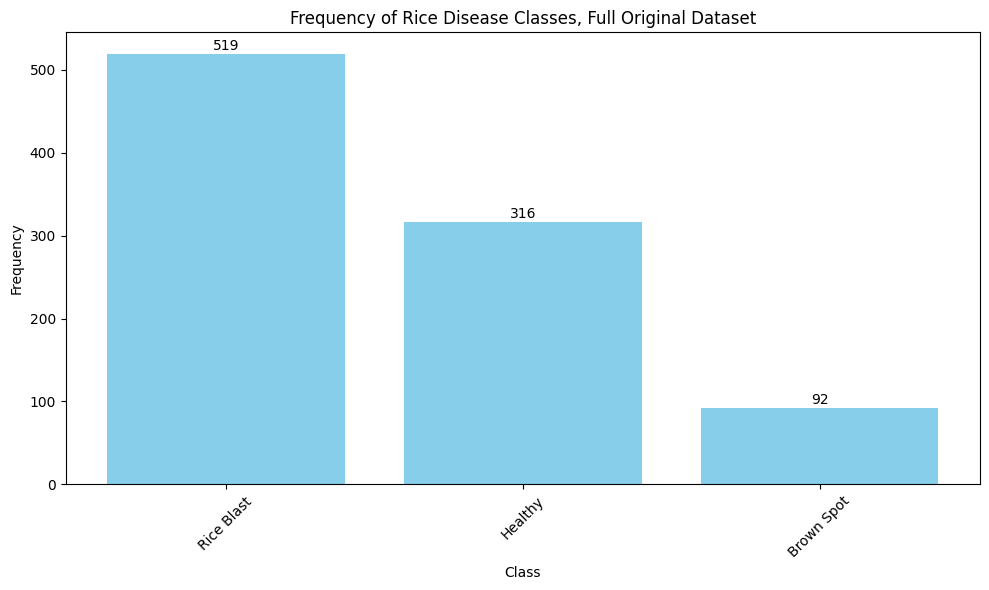

In [ ]:
# Plotting the distribution of the classes before removing the duplicated images and before filtering

df_full = pd.read_csv(f"{base_dir}/image_metadata_taiwan_full.csv")

class_counts = df_full['Class'].value_counts()

plt.figure(figsize=(10, 6))
bars = plt.bar(class_counts.index, class_counts.values, color='skyblue')

# Adding the counts above the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 1, yval, ha='center', va='bottom')

plt.title('Frequency of Rice Disease Classes, Full Original Dataset')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

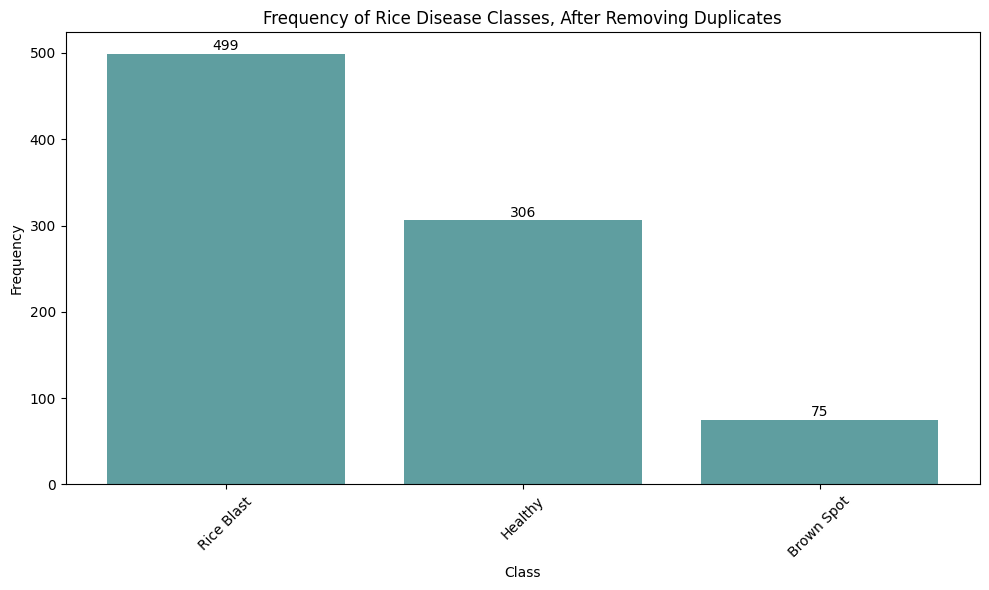

In [ ]:
# Plotting the distribution of the classes after removing the duplicated images and before filtering

df_no_duplicates = pd.read_csv(f"{base_dir}/image_metadata_taiwan_no_duplicates.csv")

class_counts = df_no_duplicates['Class'].value_counts()

plt.figure(figsize=(10, 6))
bars = plt.bar(class_counts.index, class_counts.values, color='cadetblue')

# Adding the counts above the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 1, yval, ha='center', va='bottom')

plt.title('Frequency of Rice Disease Classes, After Removing Duplicates')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

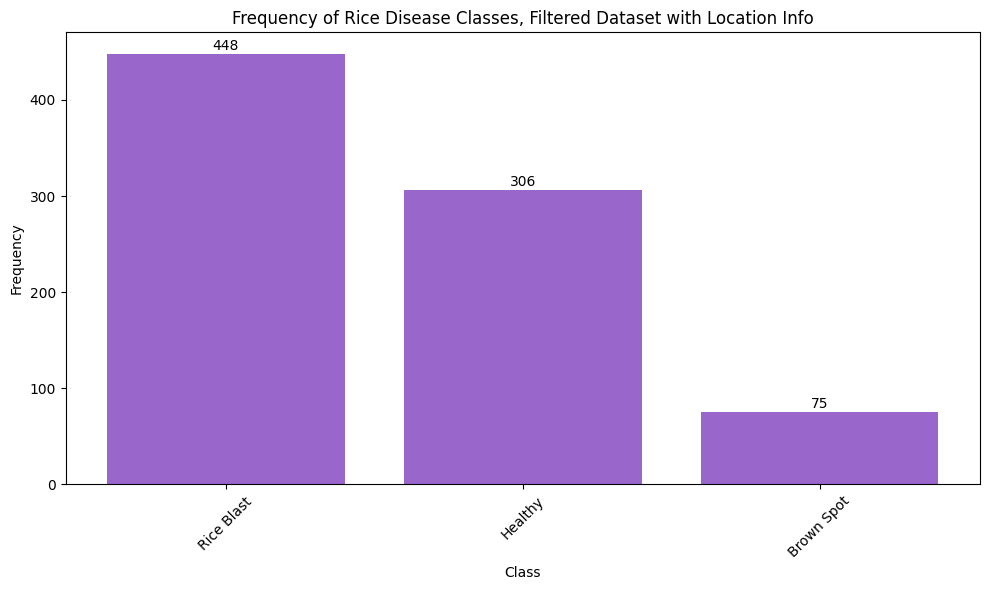

In [ ]:
# Plotting the distribution of the classes after filtering for images with a Latitude, Longitude, and Date

df_filtered = pd.read_csv(f"{base_dir}/image_metadata_taiwan_filtered_location.csv")

class_counts = df_filtered['Class'].value_counts()

plt.figure(figsize=(10, 6))
bars = plt.bar(class_counts.index, class_counts.values, color='#9966CC')

# Adding the counts above the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 1, yval, ha='center', va='bottom')

plt.title('Frequency of Rice Disease Classes, Filtered Dataset with Location Info')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
# Distribution of the target variable

df['Class'].value_counts()

Rice Blast    448
Healthy       306
Brown Spot     75
Name: Class, dtype: int64

In [ ]:
# Copying the images from each class into 1 folder

root_dir = f'{base_dir}'
destination_dir = f'{base_dir}/All_Rice_Images'

if not os.path.exists(destination_dir):
    os.makedirs(destination_dir)

for folder in os.listdir(root_dir):
    folder_path = os.path.join(root_dir, folder)
    if folder_path == destination_dir:
        continue
    if os.path.isdir(folder_path):
        for file in os.listdir(folder_path):
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
                file_path = os.path.join(folder_path, file)
                dest_path = os.path.join(destination_dir, file)
                shutil.copy(file_path, dest_path)

print("Files have been copied.")

Files have been copied.


In [ ]:
# 70-15-15 train-validation-test sets

train_df, temp_df = train_test_split(df, test_size=0.3, stratify=df['Class'])
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['Class'])

In [ ]:
os.makedirs(f'{base_dir}/Train_Dataset_Rice', exist_ok=True)
os.makedirs(f'{base_dir}/Validation_Dataset_Rice', exist_ok=True)
os.makedirs(f'{base_dir}/Test_Dataset_Rice', exist_ok=True)

In [ ]:
# Copying the images to new train, validation, and test folders from the main folder

source_directory = f'{base_dir}/All_Rice_Images'
train_directory = f'{base_dir}/Train_Dataset_Rice'
validation_directory = f'{base_dir}/Validation_Dataset_Rice'
test_directory = f'{base_dir}/Test_Dataset_Rice'

In [ ]:
def copy_images(df, source_dir, destination_dir):
    for image_id in df['Id']:
      file_path = os.path.join(source_dir, image_id)
      if os.path.isfile(file_path):
        shutil.copy(file_path, destination_dir)
    print("Files copied successfully.")

In [ ]:
copy_images(train_df, source_directory, train_directory)
copy_images(val_df, source_directory, validation_directory)
copy_images(test_df, source_directory, test_directory)

Files copied successfully.
Files copied successfully.
Files copied successfully.


In [ ]:
train_df.to_csv(f"{base_dir}/train_df_rice.csv", index=False)
val_df.to_csv(f"{base_dir}/val_df_rice.csv", index=False)
test_df.to_csv(f"{base_dir}/test_df_rice.csv", index=False)

In [ ]:
# Printing file extensions

folder_path = f'{base_dir}/All_Rice_Images'
extensions = set()

if os.path.exists(folder_path):
    for file in os.listdir(folder_path):
        _, ext = os.path.splitext(file)
        if ext:
            extensions.add(ext)

for ext in sorted(extensions):
    print(ext)

.JPG
.jpg


### **Data Exploration, such as displaying sample images:**

In [ ]:
# Loading the training, validation, and test dataframes
train_df = pd.read_csv(f"{base_dir}/train_df_rice.csv")
val_df = pd.read_csv(f"{base_dir}/val_df_rice.csv")
test_df = pd.read_csv(f"{base_dir}/test_df_rice.csv")

In [ ]:
# Distribution of the train dataset before augmentation
train_df['Class'].value_counts()

Rice Blast    313
Healthy       214
Brown Spot     53
Name: Class, dtype: int64

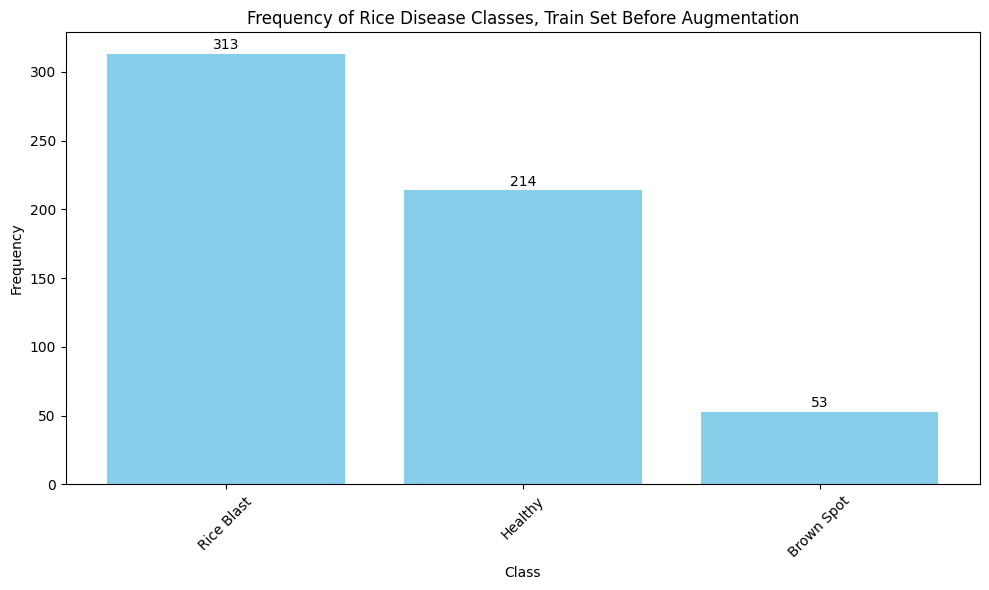

In [ ]:
# Showing the class distribution of the train dataset before augmentation

class_counts = train_df['Class'].value_counts()

plt.figure(figsize=(10, 6))
bars = plt.bar(class_counts.index, class_counts.values, color='skyblue')

# Adding the counts above the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 1, yval, ha='center', va='bottom')

plt.title('Frequency of Rice Disease Classes, Train Set Before Augmentation')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
val_df['Class'].value_counts()

Rice Blast    67
Healthy       46
Brown Spot    11
Name: Class, dtype: int64

In [ ]:
test_df['Class'].value_counts()

Rice Blast    68
Healthy       46
Brown Spot    11
Name: Class, dtype: int64

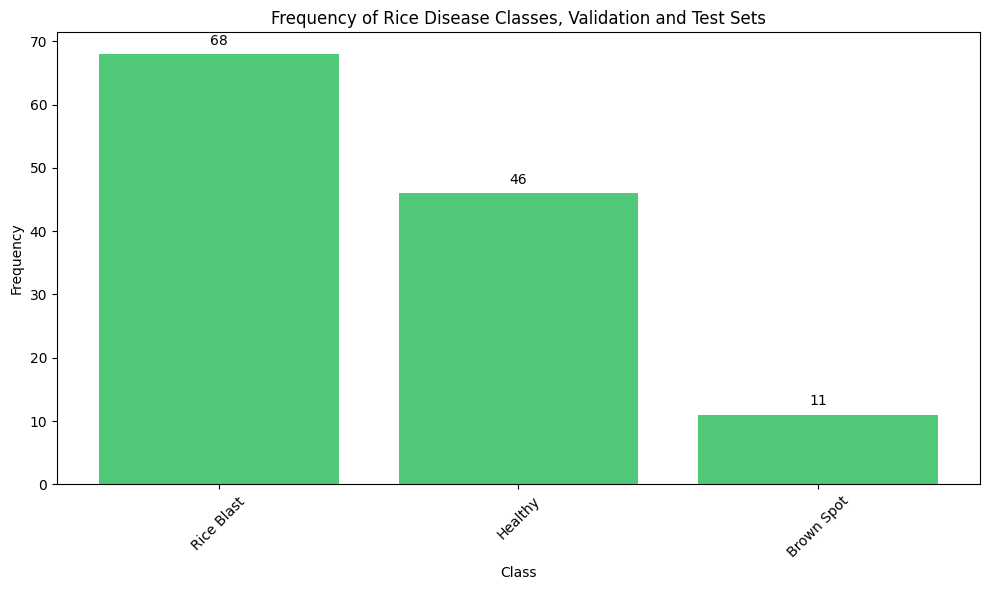

In [ ]:
# Showing the class distribution of the validation and test datasets

class_counts = test_df['Class'].value_counts()

plt.figure(figsize=(10, 6))
bars = plt.bar(class_counts.index, class_counts.values, color='#50C878')

# Adding the counts above the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 1, yval, ha='center', va='bottom')

plt.title('Frequency of Rice Disease Classes, Validation and Test Sets')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
# Displaying the raw images for train, validation, and test sets

# Function to display a grid of images
def display_images(image_paths, titles, cols=2):
    rows = len(image_paths) // cols
    plt.figure(figsize=(15, rows * 5))
    for i, (image_path, title) in enumerate(zip(image_paths, titles)):
        plt.subplot(rows, cols, i+1)
        img = mpimg.imread(image_path)
        plt.imshow(img)
        plt.title(title)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Function to get sample images from a class with a set random seed
def get_sample_images(df, image_dir, class_label, set_name, n=2, seed=50):
    np.random.seed(seed)
    sample_df = df[df['Class'] == class_label].sample(n, random_state=seed)
    image_paths = sample_df['Id'].apply(lambda x: os.path.join(image_dir, x)).values
    titles = [f"{set_name}: {os.path.basename(path)} Class: {class_label}" for path in image_paths]
    return image_paths, titles

train_image_dir = f'{base_dir}/Train_Dataset_Rice'
val_image_dir = f'{base_dir}/Validation_Dataset_Rice'
test_image_dir = f'{base_dir}/Test_Dataset_Rice'

unique_classes = train_df['Class'].unique()

# Displaying images for each class
for class_label in unique_classes:
    # Getting sample images for the train, validation, and test sets
    train_image_paths, train_titles = get_sample_images(train_df, train_image_dir, class_label, 'Train', n=2)
    val_image_paths, val_titles = get_sample_images(val_df, val_image_dir, class_label, 'Validation', n=2)
    test_image_paths, test_titles = get_sample_images(test_df, test_image_dir, class_label, 'Test', n=2)
    combined_image_paths = train_image_paths.tolist() + val_image_paths.tolist() + test_image_paths.tolist()
    combined_titles = train_titles + val_titles + test_titles
    # Displaying the images with a previous function
    display_images(combined_image_paths, combined_titles, cols=2)


In [ ]:
# Displaying raw images - 1 for each class

# Function to display a grid of images
def display_images(image_paths, titles, cols=2):
    rows = (len(image_paths) + cols - 1) // cols
    plt.figure(figsize=(15, rows * 5))
    for i, (image_path, title) in enumerate(zip(image_paths, titles)):
        plt.subplot(rows, cols, i + 1)
        img = mpimg.imread(image_path)
        plt.imshow(img)
        plt.title(title)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Function to get a sample image from a class with a set random seed
def get_sample_image(df, image_dir, class_label, n=1, seed=81):
    np.random.seed(seed)
    sample_df = df[df['Class'] == class_label].sample(n, random_state=seed)
    image_path = os.path.join(image_dir, sample_df.iloc[0]['Id'])
    title = f"Class: {class_label} - {os.path.basename(image_path)}"
    return image_path, title

train_image_dir = f'{base_dir}/Train_Dataset_Rice'
unique_classes = train_df['Class'].unique()

# Displaying one image for each class in a grid with 2 columns
image_paths = []
titles = []
for class_label in unique_classes:
    image_path, title = get_sample_image(train_df, train_image_dir, class_label)
    image_paths.append(image_path)
    titles.append(title)

display_images(image_paths, titles, cols=2)

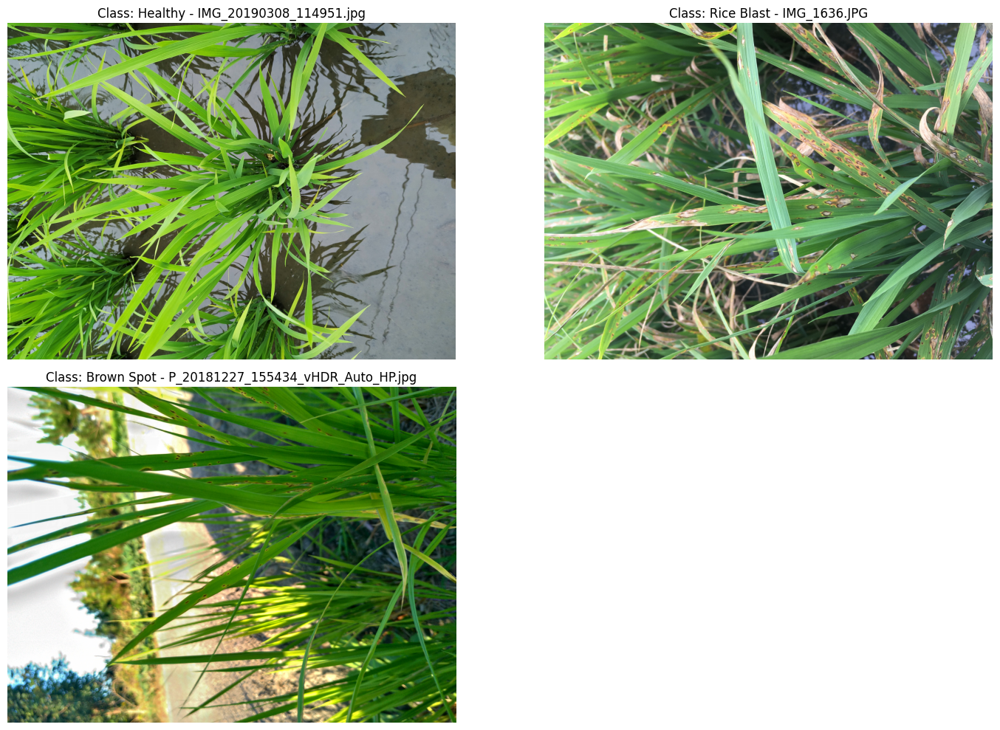

In [ ]:
# Displaying raw images - 1 for each class (not using a random seed)  # Some images seem rotated here, but are not

# Function to display a grid of images
def display_images(image_paths, titles, cols=2):
    rows = (len(image_paths) + cols - 1) // cols
    plt.figure(figsize=(15, rows * 5))
    for i, (image_path, title) in enumerate(zip(image_paths, titles)):
        plt.subplot(rows, cols, i + 1)
        img = mpimg.imread(image_path)
        plt.imshow(img)
        plt.title(title)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Function to get the image path given the directory and the filename
def get_image_path(image_dir, filename, class_label):
    image_path = os.path.join(image_dir, filename)
    title = f"Class: {class_label} - {os.path.basename(image_path)}"
    return image_path, title

train_image_dir = f'{base_dir}/Train_Dataset_Rice'

specified_images = {
    'Healthy': 'IMG_20190308_114951.jpg',
    'Rice Blast': 'IMG_1636.JPG',
    'Brown Spot': 'P_20181227_155434_vHDR_Auto_HP.jpg'
}

# Displaying one image for each class in a grid with 2 columns
image_paths = []
titles = []
for class_label, filename in specified_images.items():
    image_path, title = get_image_path(train_image_dir, filename, class_label)
    image_paths.append(image_path)
    titles.append(title)

display_images(image_paths, titles, cols=2)


In [ ]:
# Creating augmented images for the train set - to generate more training examples and balance the classes during training

train_df = pd.read_csv(f"{base_dir}/train_df_rice.csv")
train_image_dir = f'{base_dir}/Train_Dataset_Rice'

# Directory where the augmented images will be saved
augmented_images_dir = f'{base_dir}/augmented_only_train'
os.makedirs(augmented_images_dir, exist_ok=True)

# Initializing the dataframe to hold information for the augmented images
augmented_only_train_df = pd.DataFrame(columns=['Id', 'Class'])

# Defining the augmentation function
def augment_image(image, image_id, class_label, augmentation_counter):
    augmented_images = []
    # Removing the file extension from the original image_id
    base_image_id = os.path.splitext(image_id)[0]
    # Applying each augmentation function
    for i in range(augmentation_counter):
        augmented = image
        augmented = tf.image.random_flip_left_right(augmented)
        augmented = tf.image.random_flip_up_down(augmented)
        augmented = tf.image.random_brightness(augmented, max_delta=0.3)
        augmented = tf.clip_by_value(augmented, 0, 255)

        # Saving the augmented image
        new_image_id = f"{base_image_id}_{i}.jpg"
        new_image_path = os.path.join(augmented_images_dir, new_image_id)
        tf.io.write_file(new_image_path, tf.io.encode_jpeg(augmented))

        # Adding the information to the list
        augmented_images.append({'Id': new_image_id, 'Class': class_label})

    return augmented_images

# Augmenting the images per class in the train set to reach 400 images
for class_label, group in train_df.groupby('Class'):
    num_images_to_augment = 400 - len(group)
    if num_images_to_augment > 0:
        images_to_augment = group.sample(n=num_images_to_augment, replace=True)
        for idx, row in images_to_augment.iterrows():
            image_path = os.path.join(train_image_dir, row['Id'])
            image = tf.io.read_file(image_path)
            image = tf.io.decode_image(image, channels=3)
            # Performing the actual augmentation
            augmented_images_info = augment_image(image, row['Id'], row['Class'], 1)
            # Appending the augmented image's info to the specified dataframe
            augmented_only_train_df = augmented_only_train_df.append(augmented_images_info, ignore_index=True)

# Saving the dataFrame of augmented images
augmented_only_train_df.to_csv(f'{base_dir}/augmented_only_train_df.csv', index=False)

<ipython-input-7-28f1954760bb>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  augmented_only_train_df = augmented_only_train_df.append(augmented_images_info, ignore_index=True)
<ipython-input-7-28f1954760bb>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  augmented_only_train_df = augmented_only_train_df.append(augmented_images_info, ignore_index=True)
<ipython-input-7-28f1954760bb>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  augmented_only_train_df = augmented_only_train_df.append(augmented_images_info, ignore_index=True)
<ipython-input-7-28f1954760bb>:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  augmented_only_train_df

In [ ]:
augmented_only_train_df = pd.read_csv(f"{base_dir}/augmented_only_train_df.csv")
augmented_only_train_df['Class'].value_counts()  # Number of augmented images that were created for each class

Brown Spot    347
Healthy       186
Rice Blast     87
Name: Class, dtype: int64

In [ ]:
augmented_only_train_df.head()

,Id,Class
0,P_20181227_163007_vHDR_Auto_0.jpg,Brown Spot
1,P_20181227_161826_vHDR_Auto_HP_0.jpg,Brown Spot
2,P_20181227_162230_vHDR_Auto_0.jpg,Brown Spot
3,P_20181227_163043_vHDR_Auto_HP (1)_0.jpg,Brown Spot
4,P_20181227_153711_vHDR_Auto_0.jpg,Brown Spot


In [ ]:
# Combining the dataframes of the augmented images and the original training dataframe, adding information for the augmented images as needed

# Adjusting the Ids by removing the last 2 characters and the extension for matching
augmented_only_train_df['Base_Id'] = augmented_only_train_df['Id'].str.rsplit('_', 1).str[0]
augmented_only_train_df['Base_Id'] = augmented_only_train_df['Base_Id'].apply(lambda x: x.rsplit('.', 1)[0])

# Preparing the train_df for case-insensitive matching by adjusting its Ids similarly
train_df['Normalized_Id'] = train_df['Id'].apply(lambda x: x.rsplit('.', 1)[0])

# Creating a dictionary for lookup from train_df using 'Normalized_Id'
train_info_dict = train_df.set_index('Normalized_Id').to_dict(orient='index')

# Function to fill in missing information based on the normalized Base_Id
def fill_info(row):
    info = train_info_dict.get(row['Base_Id'], {})
    for col in ['Latitude', 'Longitude', 'Date', 'Date and Time']:  # All missing columns from the augmented image df
        if col in info:
            row[col] = info[col]
    return row

# Applying the function to augmented_only_train_df to fill in missing information
augmented_filled = augmented_only_train_df.apply(fill_info, axis=1)

# Dropping the temporary columns from augmented_filled and train_df
augmented_filled.drop(['Base_Id'], axis=1, inplace=True)
train_df.drop(['Normalized_Id'], axis=1, inplace=True)

# Concatenating the augmented_filled df to train_df to create the final combined dataframe
train_df_with_augmentation_rice = pd.concat([train_df, augmented_filled], ignore_index=True)

# Verifying the adjustments and correct filling of info
train_df_with_augmentation_rice.tail()

<ipython-input-43-e89ac6625323>:2: FutureWarning: In a future version of pandas all arguments of StringMethods.rsplit except for the argument 'pat' will be keyword-only.
  augmented_only_train_df['Base_Id'] = augmented_only_train_df['Id'].str.rsplit('_', 1).str[0]


,Id,Latitude,Longitude,Date,Class,Date and Time
1195,IMG_20190331_142609_0.jpg,23.240385,120.325300,2019-03-31,Rice Blast,2019:03:31 14:26:09
1196,IMG_20190305_132124_0.jpg,24.031845,120.696152,2019-03-05,Rice Blast,2019:03:05 13:21:24
1197,IMG_20190305_105337_0.jpg,24.017449,120.554574,2019-03-05,Rice Blast,2019:03:05 10:53:37
1198,IMG_1672_0.jpg,23.408203,120.318047,2019-03-15,Rice Blast,2019:03:15 14:11:05
1199,IMG_20190305_094839_0.jpg,24.029424,120.571214,2019-03-05,Rice Blast,2019:03:05 09:48:38


In [ ]:
# Distribution of the train dataset after augmentation
train_df_with_augmentation_rice['Class'].value_counts()

Healthy       400
Rice Blast    400
Brown Spot    400
Name: Class, dtype: int64

In [ ]:
train_df_with_augmentation_rice.to_csv(f'{base_dir}/train_df_with_augmentation_rice.csv', index=False)

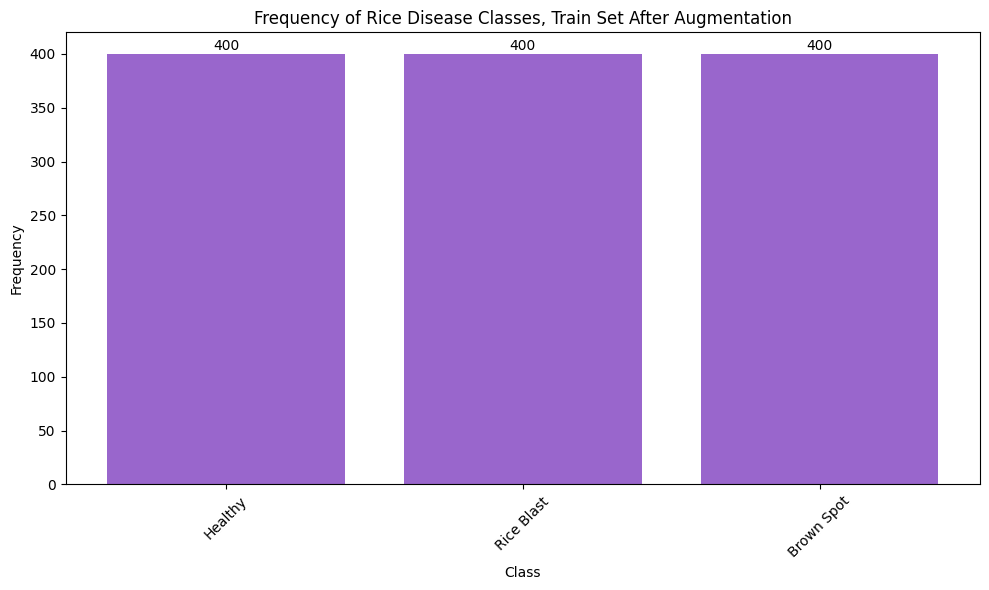

In [ ]:
# Showing the class distribution of the train dataset after augmentation

train_df_with_augmentation_rice = pd.read_csv(f"{base_dir}/train_df_with_augmentation_rice.csv")

class_counts = train_df_with_augmentation_rice['Class'].value_counts()

plt.figure(figsize=(10, 6))
bars = plt.bar(class_counts.index, class_counts.values, color='#9966CC')

# Adding the counts above the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 1, yval, ha='center', va='bottom')

plt.title('Frequency of Rice Disease Classes, Train Set After Augmentation')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
'''
folder_A = f'{base_dir}/All_Rice_Images'
folder_B = f'{base_dir}/augmented_only_train'
folder_C = f'{base_dir}/All_Rice_Images_with_Train_Augmentation'

os.makedirs(folder_C, exist_ok=True)

# Copying images from folder A to folder C
for image_path in glob.glob(os.path.join(folder_A, '*')):
    shutil.copy(image_path, folder_C)

# Copying images from folder B to folder C
for image_path in glob.glob(os.path.join(folder_B, '*')):
    shutil.copy(image_path, folder_C)
'''

In [ ]:
# Creating a folder with the combined Train Images and Augmented Images

folder_A = f'{base_dir}/Train_Dataset_Rice'
folder_B = f'{base_dir}/augmented_only_train'
folder_C = f'{base_dir}/Train_Dataset_with_Augmentation_Rice'

os.makedirs(folder_C, exist_ok=True)

# Copying images from folder A to folder C
for image_path in glob.glob(os.path.join(folder_A, '*')):
    shutil.copy(image_path, folder_C)

# Copying images from folder B to folder C
for image_path in glob.glob(os.path.join(folder_B, '*')):
    shutil.copy(image_path, folder_C)

In [ ]:
# Displaying a couple augmented images and the original image side-by-side (vertically)

original_image_paths = [f'{base_dir}/Train_Dataset_Rice/20231006_163255.jpg', f'{base_dir}/Train_Dataset_Rice/BLAST1_039.JPG']
augmented_image_paths = [f'{base_dir}/augmented_only_train/20231006_163255_0.jpg', f'{base_dir}/augmented_only_train/BLAST1_039_0.jpg']

# Function to load and prepare the images
def load_and_prepare_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image, tf.uint8)
    return image

original_images = [load_and_prepare_image(path) for path in original_image_paths]
augmented_images = [load_and_prepare_image(path) for path in augmented_image_paths]
plt.figure(figsize=(10, 5))

for i, (original, augmented) in enumerate(zip(original_images, augmented_images)):
    # Displaying the original images
    plt.subplot(2, 2, i + 1)
    plt.imshow(original.numpy())
    plt.title(f'Original Image {i + 1}')
    plt.axis('off')

    # Displaying the augmented images
    plt.subplot(2, 2, i + 3)
    plt.imshow(augmented.numpy())
    plt.title(f'Augmented Image {i + 1}')
    plt.axis('off')

plt.tight_layout()
plt.show()

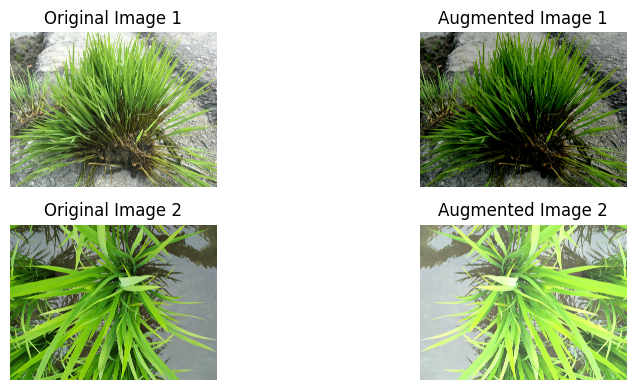

In [ ]:
# Displaying a couple augmented images and the original image side-by-side (horizontally)

original_image_paths = [f'{base_dir}/Train_Dataset_Rice/IMG_1202.JPG', f'{base_dir}/Train_Dataset_Rice/IMG_20190308_114926.jpg']
augmented_image_paths = [f'{base_dir}/augmented_only_train/IMG_1202_0.jpg', f'{base_dir}/augmented_only_train/IMG_20190308_114926_0.jpg']

# Function to load and prepare images
def load_and_prepare_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image, tf.uint8)
    return image

original_images = [load_and_prepare_image(path) for path in original_image_paths]
augmented_images = [load_and_prepare_image(path) for path in augmented_image_paths]
num_images = len(original_image_paths)
plt.figure(figsize=(10, num_images * 2))

for i in range(num_images):
    # Displaying the original images
    plt.subplot(num_images, 2, i * 2 + 1)
    plt.imshow(original_images[i].numpy())
    plt.title(f'Original Image {i + 1}')
    plt.axis('off')

    # Displaying the augmented images
    plt.subplot(num_images, 2, i * 2 + 2)
    plt.imshow(augmented_images[i].numpy())
    plt.title(f'Augmented Image {i + 1}')
    plt.axis('off')

plt.tight_layout()
plt.show()

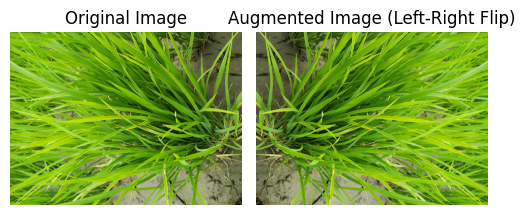

In [ ]:
# Displaying an original image and augmented image with a left-right flip side-by-side (augmented image not in actual dataset)

image_paths = [f'{base_dir}/Train_Dataset_Rice/IMG_20190305_131819.jpg']
original_images = [tf.io.read_file(image_path) for image_path in image_paths]
original_images = [tf.image.decode_jpeg(image) for image in original_images]

# Applying the augmentation
augmented_images = []
for image in original_images:
    augmented_image = tf.image.random_flip_left_right(image)
    #augmented_image = tf.image.random_flip_up_down(augmented_image)
    #augmented_image = tf.image.random_brightness(augmented_image, max_delta=0.3)
    augmented_images.append(augmented_image)

original_images = [tf.cast(image, tf.uint8) for image in original_images]
augmented_images = [tf.cast(image, tf.uint8) for image in augmented_images]
plt.figure(figsize=(10, 5))

for i, (original, augmented) in enumerate(zip(original_images, augmented_images)):
    # Original image
    plt.subplot(1, 4, i*2 + 1)
    plt.imshow(original)
    plt.title(f'Original Image')
    plt.axis('off')

    # Augmented image
    plt.subplot(1, 4, i*2 + 2)
    plt.imshow(augmented)
    plt.title(f'Augmented Image (Left-Right Flip)')
    plt.axis('off')

plt.tight_layout()
plt.show()

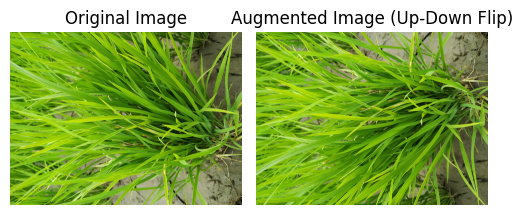

In [ ]:
# Displaying an original image and augmented image with an up-down flip side-by-side (augmented image not in actual dataset)

image_paths = [f'{base_dir}/Train_Dataset_Rice/IMG_20190305_131819.jpg']
original_images = [tf.io.read_file(image_path) for image_path in image_paths]
original_images = [tf.image.decode_jpeg(image) for image in original_images]

# Applying the augmentation
augmented_images = []
for image in original_images:
    #augmented_image = tf.image.random_flip_left_right(image)
    augmented_image = tf.image.random_flip_up_down(image)
    #augmented_image = tf.image.random_brightness(augmented_image, max_delta=0.3)
    augmented_images.append(augmented_image)

original_images = [tf.cast(image, tf.uint8) for image in original_images]
augmented_images = [tf.cast(image, tf.uint8) for image in augmented_images]
plt.figure(figsize=(10, 5))

for i, (original, augmented) in enumerate(zip(original_images, augmented_images)):
    # Original image
    plt.subplot(1, 4, i*2 + 1)
    plt.imshow(original)
    plt.title(f'Original Image')
    plt.axis('off')

    # Augmented image
    plt.subplot(1, 4, i*2 + 2)
    plt.imshow(augmented)
    plt.title(f'Augmented Image (Up-Down Flip)')
    plt.axis('off')

plt.tight_layout()
plt.show()

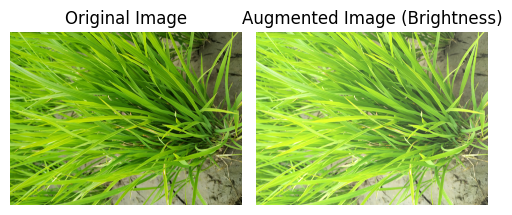

In [ ]:
# Displaying an original image and augmented image with a brightness adjustment side-by-side (augmented image not in actual dataset)

image_paths = [f'{base_dir}/Train_Dataset_Rice/IMG_20190305_131819.jpg']
original_images = [tf.io.read_file(image_path) for image_path in image_paths]
original_images = [tf.image.decode_jpeg(image) for image in original_images]

# Applying the augmentation
augmented_images = []
for image in original_images:
    #augmented_image = tf.image.random_flip_left_right(image)
    #augmented_image = tf.image.random_flip_up_down(augmented_image)
    augmented_image = tf.image.random_brightness(image, max_delta=0.3)
    augmented_images.append(augmented_image)

original_images = [tf.cast(image, tf.uint8) for image in original_images]
augmented_images = [tf.cast(image, tf.uint8) for image in augmented_images]
plt.figure(figsize=(10, 5))

for i, (original, augmented) in enumerate(zip(original_images, augmented_images)):
    # Original image
    plt.subplot(1, 4, i*2 + 1)
    plt.imshow(original)
    plt.title(f'Original Image')
    plt.axis('off')

    # Augmented image
    plt.subplot(1, 4, i*2 + 2)
    plt.imshow(augmented)
    plt.title(f'Augmented Image (Brightness)')
    plt.axis('off')

plt.tight_layout()
plt.show()

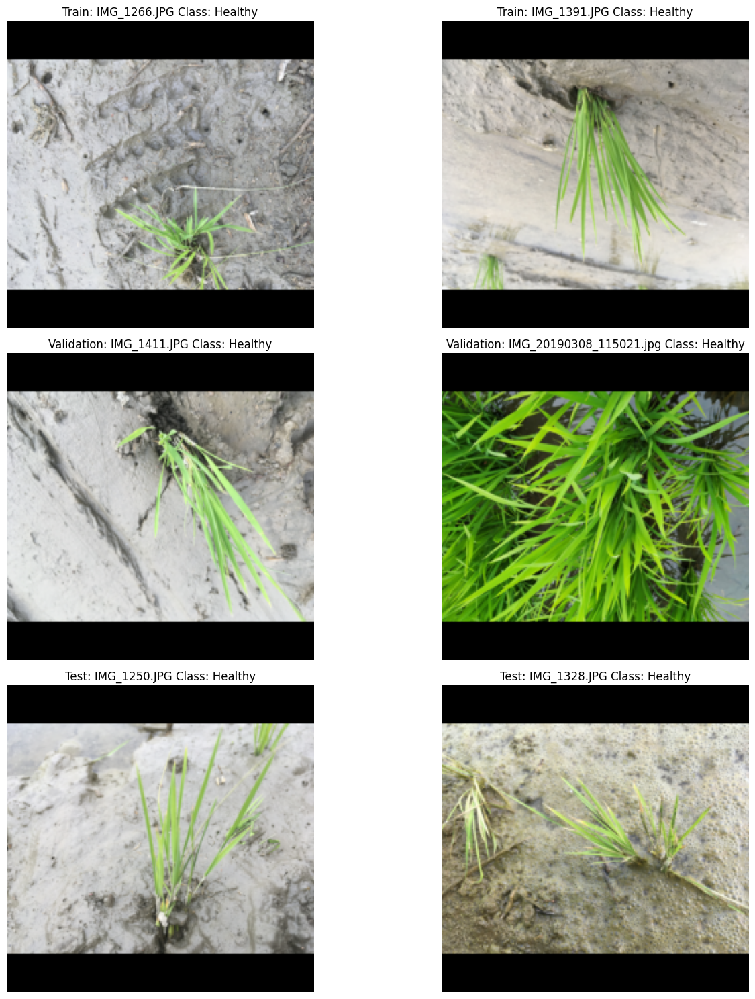

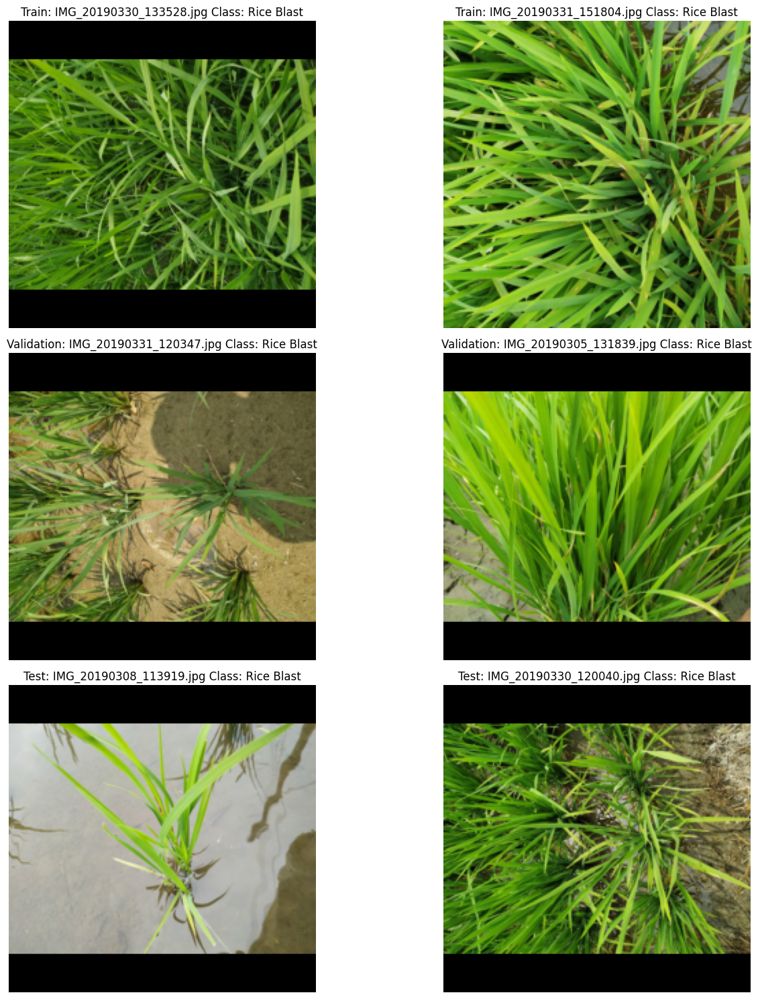

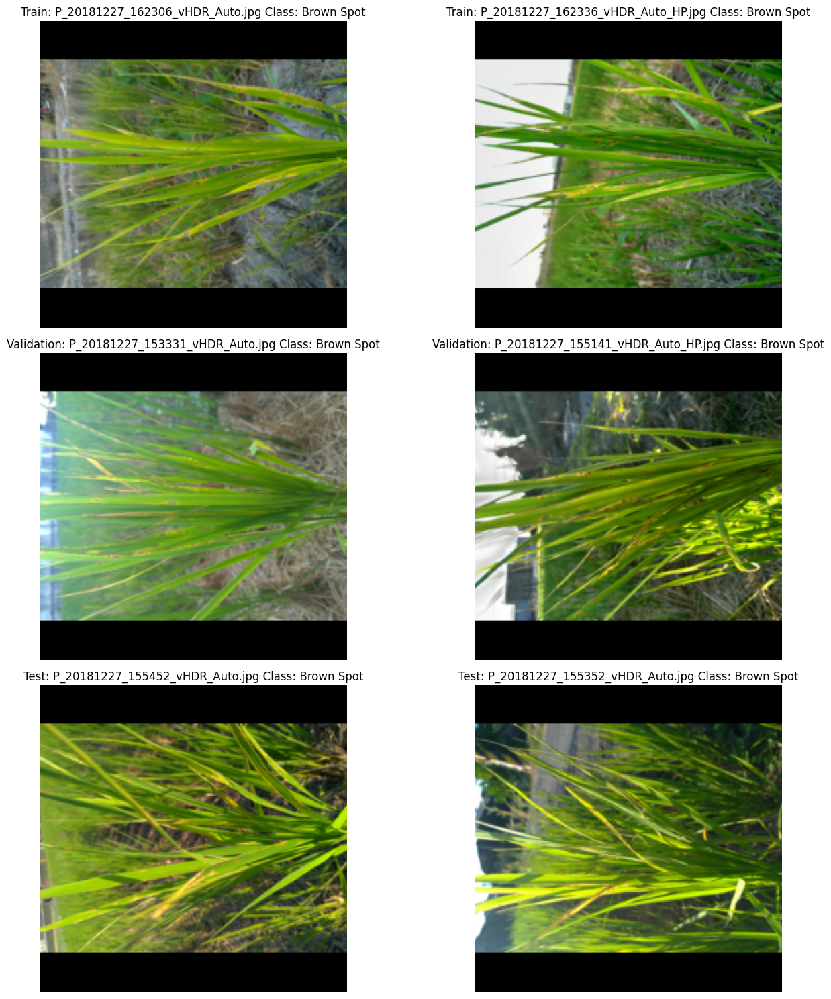

In [ ]:
# Displaying the resized images (same images as the raw images, with padding and antialias)

# Function to display a grid of images
def display_images(image_paths, titles, cols=2):
    rows = len(image_paths) // cols
    plt.figure(figsize=(15, rows * 5))
    for i, (image_path, title) in enumerate(zip(image_paths, titles)):
        plt.subplot(rows, cols, i+1)
        img = tf.io.read_file(image_path)
        img = tf.image.decode_jpeg(img, channels=3)
        img = tf.image.resize_with_pad(img, 224, 224, antialias=True)
        plt.imshow(img.numpy().astype('uint8'))
        plt.title(title)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Function to get sample images from a class with a set random seed
def get_sample_images(df, image_dir, class_label, set_name, n=2, seed=45):
    np.random.seed(seed)
    sample_df = df[df['Class'] == class_label].sample(n, random_state=seed)
    image_paths = sample_df['Id'].apply(lambda x: os.path.join(image_dir, x)).values
    titles = [f"{set_name}: {os.path.basename(path)} Class: {class_label}" for path in image_paths]
    return image_paths, titles

base_dir = f'{base_dir}'
train_image_dir = f'{base_dir}/Train_Dataset_Rice'
val_image_dir = f'{base_dir}/Validation_Dataset_Rice'
test_image_dir = f'{base_dir}/Test_Dataset_Rice'

unique_classes = train_df['Class'].unique()

# Displaying images for each class
for class_label in unique_classes:
    train_image_paths, train_titles = get_sample_images(train_df, train_image_dir, class_label, 'Train', n=2)
    val_image_paths, val_titles = get_sample_images(val_df, val_image_dir, class_label, 'Validation', n=2)
    test_image_paths, test_titles = get_sample_images(test_df, test_image_dir, class_label, 'Test', n=2)
    combined_image_paths = train_image_paths.tolist() + val_image_paths.tolist() + test_image_paths.tolist()
    combined_titles = train_titles + val_titles + test_titles
    display_images(combined_image_paths, combined_titles, cols=2)

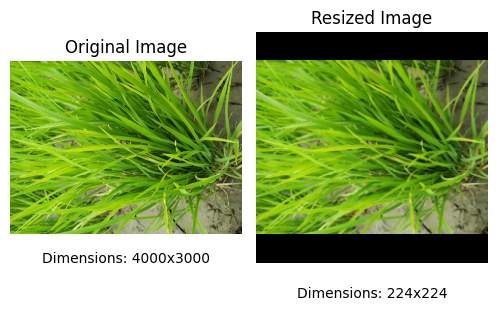

In [ ]:
# Displaying an original image and a resized image side-by-side

image_paths = [f'{base_dir}/All_Rice_Images/IMG_20190305_131819.jpg']
original_images = [tf.io.read_file(image_path) for image_path in image_paths]
original_images = [tf.image.decode_jpeg(image) for image in original_images]

# Resizing the images
resized_images = []
for image in original_images:
    resized_image = tf.image.resize_with_pad(image, 224, 224, antialias=True)
    resized_images.append(resized_image)

original_images = [tf.cast(image, tf.uint8) for image in original_images]
resized_images = [tf.cast(image, tf.uint8) for image in resized_images]

plt.figure(figsize=(10, 6))

for i, (original, resized) in enumerate(zip(original_images, resized_images)):
    # Original image(s)
    ax1 = plt.subplot(1, 4, i*2 + 1)
    plt.imshow(original)
    plt.title(f'Original Image')
    plt.axis('off')
    # Displaying the dimensions below the original image
    plt.text(0.5, -0.1, f'Dimensions: {original.shape[1]}x{original.shape[0]}',
             size=10, ha='center', va='top', transform=ax1.transAxes)

    # Resized image(s)
    ax2 = plt.subplot(1, 4, i*2 + 2)
    plt.imshow(resized)
    plt.title(f'Resized Image')
    plt.axis('off')
    # Displaying the dimensions below the resized image
    plt.text(0.5, -0.1, f'Dimensions: {resized.shape[1]}x{resized.shape[0]}',
             size=10, ha='center', va='top', transform=ax2.transAxes)

plt.tight_layout()
plt.show()